# **Project: House Prices - Linear Regression Techniques**

##### **Reference**: [Anna Montoya and DataCanary. House Prices - Advanced Regression Techniques. https://kaggle.com/competitions/house-prices-advanced-regression-techniques, 2016. Kaggle.](https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques)

--- 
## **1. Look the big picture**

- **Objective**: Predict house prices by building a robust linear regression model.
- **Goal**: Minimize the Root-Mean-Squared-Error (RMSE) to improve prediction accuracy.
- **Dataset**: 
  - The dataset contains various features about houses (e.g., square footage, number of rooms, etc.) and their sale prices.
  - Provided by the Kaggle competition: *"House Prices - Advanced Regression Techniques."*
- **Evaluation Metric**: Root-Mean-Squared-Error (RMSE).
  

---
## **2. Get the data**

In [1]:
from sklearn.model_selection import StratifiedShuffleSplit
import pandas as pd


def split_train_test(df, bins):
    # Create a price category column
    # df["SalePriceCategory"] = pd.qcut(df["SalePrice"], q=5, labels=False)
    df["SalePriceCategory"] = pd.cut(df["SalePrice"], labels=False, bins=bins)

    # Stratified sampling
    strat_split = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
    for train_idx, test_idx in strat_split.split(df, df["SalePriceCategory"]):
        strat_train_set = df.loc[train_idx].drop(columns=["SalePriceCategory"])
        strat_test_set = df.loc[test_idx].drop(columns=["SalePriceCategory"])
    
    return strat_train_set, strat_test_set

In [2]:

df = pd.read_csv("../data/house_price_project/train.csv")

# df, df_test = split_train_test(df)

### EDA to find the best split

In [3]:
print("Len of df is", len(df))
print("Q could be", 0.04 * (len(df)))

Len of df is 1460
Q could be 58.4


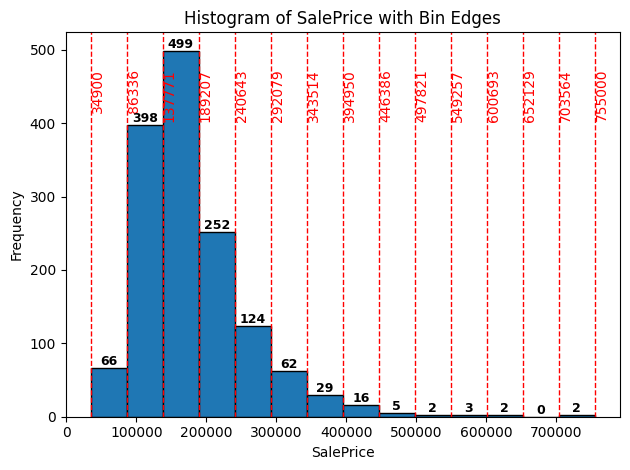

In [4]:
import matplotlib.pyplot as plt

# Plot histogram and get bin edges
counts, bin_edges, bars = plt.hist(df["SalePrice"], bins=14, edgecolor='black')

# Add vertical lines at bin edges
for edge in bin_edges:
    plt.axvline(edge, color='red', linestyle='--', linewidth=1)

# Annotate each bin edge
for edge in bin_edges:
    plt.text(edge, max(counts)*0.95, f'{edge:.0f}', rotation=90, color='red', va='top')

# Add count labels on top of each bar
for count, bar in zip(counts, bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, int(count),
             ha='center', va='bottom', fontsize=9, fontweight='bold', color='black')

plt.title("Histogram of SalePrice with Bin Edges")
plt.xlabel("SalePrice")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [5]:

df["SalePriceCategory"] = pd.cut(df["SalePrice"], labels=False, bins=14)


df.groupby("SalePriceCategory")["SalePrice"].describe().T

SalePriceCategory,0,1,2,3,4,5,6,7,8,9,10,11,13
count,66.000000,398.000000,499.000000,252.000000,124.000000,62.000000,29.000000,16.000000,5.000000,2.000000,3.000000,2.000000,2.000000
mean,72761.924242,118288.924623,161713.324649,213274.051587,264640.862903,317881.096774,371834.068966,418869.750000,468690.000000,519918.500000,564838.000000,618328.500000,750000.000000
std,14113.953039,13789.067284,15377.139292,15624.978248,14104.075813,13219.236527,15288.561567,16753.918318,12293.006142,25571.102528,15690.655149,9434.925781,7071.067812
min,34900.000000,87000.000000,137900.000000,189950.000000,241000.000000,293077.000000,345000.000000,395000.000000,451950.000000,501837.000000,555000.000000,611657.000000,745000.000000
25%,65000.000000,109000.000000,147200.000000,200000.000000,252508.500000,309250.000000,360000.000000,402965.250000,465000.000000,510877.750000,555790.500000,614992.750000,747500.000000
50%,79700.000000,120000.000000,160000.000000,213125.000000,263783.500000,317500.000000,374000.000000,419149.000000,466500.000000,519918.500000,556581.000000,618328.500000,750000.000000
75%,82875.000000,129900.000000,175500.000000,227000.000000,275125.000000,325543.000000,383970.000000,431788.500000,475000.000000,528959.250000,569757.000000,621664.250000,752500.000000
max,86000.000000,137500.000000,189000.000000,240000.000000,290000.000000,342643.000000,394617.000000,446261.000000,485000.000000,538000.000000,582933.000000,625000.000000,755000.000000


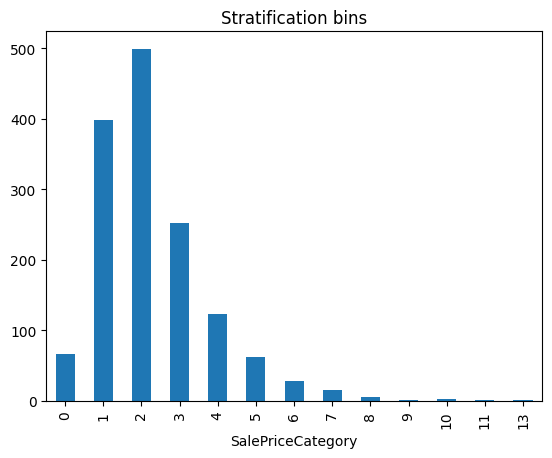

In [6]:
df["SalePriceCategory"].value_counts().sort_index().plot(kind="bar", title="Stratification bins");

In [7]:
df.drop(columns=["SalePriceCategory"], inplace=True)

### Split

In [8]:
bins_to_split = 14
df, df_test = split_train_test(df, bins=bins_to_split)

In [9]:
df.sort_values("SalePrice", ascending=False).head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,...,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000
1169,1170,60,RL,118.0,35760,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Normal,625000
1046,1047,60,RL,85.0,16056,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,New,Partial,556581
440,441,20,RL,105.0,15431,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,WD,Normal,555000
769,770,60,RL,47.0,53504,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,538000


In [10]:
df_test.sort_values("SalePrice", ascending=False).head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
898,899,20,RL,100.0,12919,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2010,New,Partial,611657
803,804,60,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2009,New,Partial,582933
185,186,75,RM,90.0,22950,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,GdPrv,NaN,0,6,2006,WD,Normal,475000
473,474,20,RL,110.0,14977,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2007,New,Partial,440000


#### Split comparison

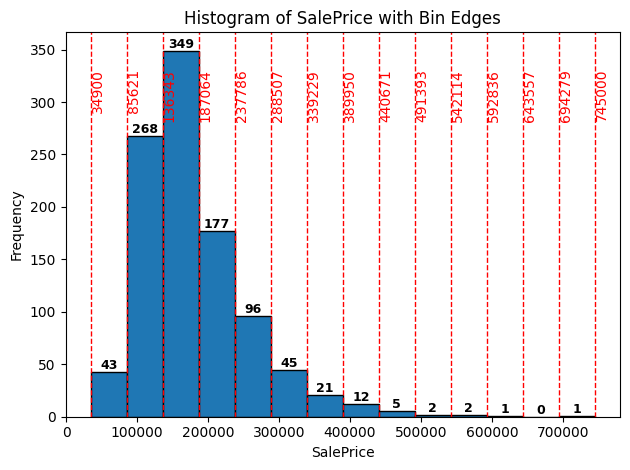

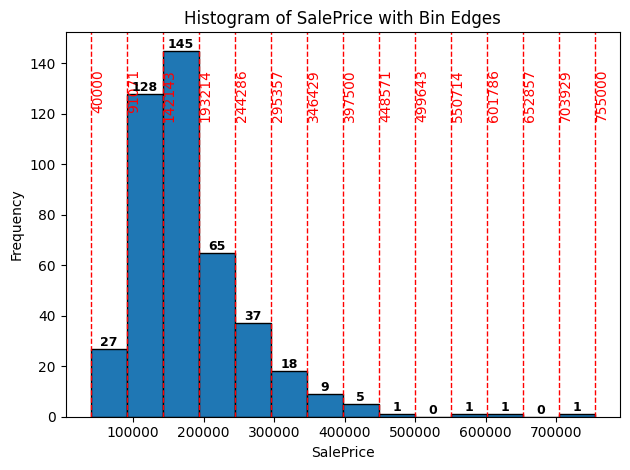

In [11]:
import matplotlib.pyplot as plt

# Plot histogram and get bin edges
counts, bin_edges, bars = plt.hist(df["SalePrice"], bins=bins_to_split, edgecolor='black')

# Add vertical lines at bin edges
for edge in bin_edges:
    plt.axvline(edge, color='red', linestyle='--', linewidth=1)

# Annotate each bin edge
for edge in bin_edges:
    plt.text(edge, max(counts)*0.95, f'{edge:.0f}', rotation=90, color='red', va='top')

# Add count labels on top of each bar
for count, bar in zip(counts, bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, int(count),
             ha='center', va='bottom', fontsize=9, fontweight='bold', color='black')

plt.title("Histogram of SalePrice with Bin Edges")
plt.xlabel("SalePrice")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# plot for test

# Plot histogram and get bin edges
counts, bin_edges, bars = plt.hist(df_test["SalePrice"], bins=bins_to_split, edgecolor='black')

# Add vertical lines at bin edges
for edge in bin_edges:
    plt.axvline(edge, color='red', linestyle='--', linewidth=1)

# Annotate each bin edge
for edge in bin_edges:
    plt.text(edge, max(counts)*0.95, f'{edge:.0f}', rotation=90, color='red', va='top')

# Add count labels on top of each bar
for count, bar in zip(counts, bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, int(count),
             ha='center', va='bottom', fontsize=9, fontweight='bold', color='black')

plt.title("Histogram of SalePrice with Bin Edges")
plt.xlabel("SalePrice")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [12]:
df.shape

(1022, 81)

---
## **3. Explore and visualize the data to gain insights.**

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats

### Find null values

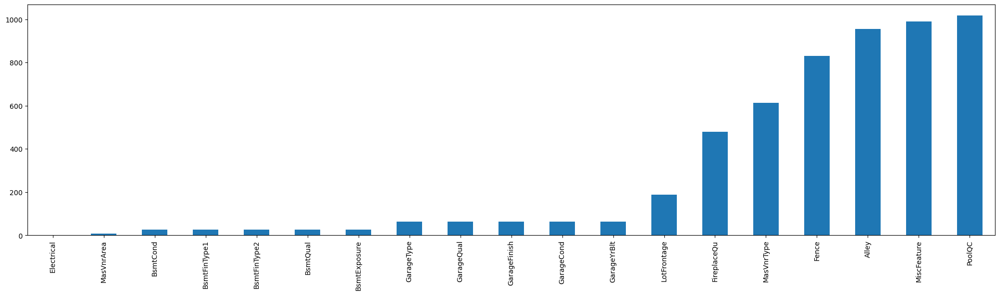

In [14]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot(kind='bar', figsize=(25, 6));


#### Fix null values in "object" types

In [15]:
for col in df.columns[1:]:
    if df[col].dtype == 'object':
        df[col] = df[col].fillna("MISSING")

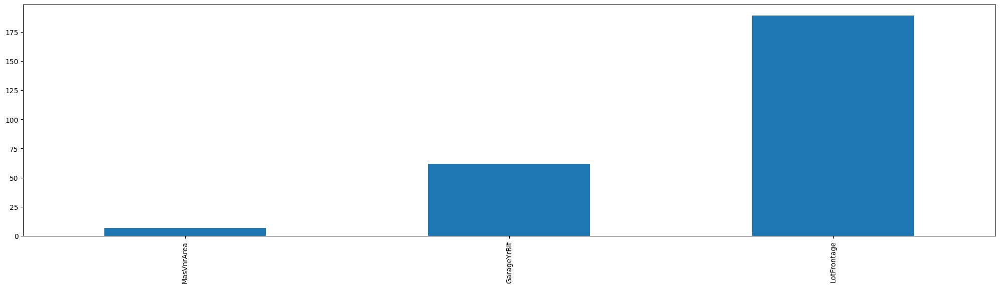

In [16]:
missing = df.isnull().sum()
missing = missing[missing > 0]
missing.sort_values(inplace=True)
missing.plot(kind='bar', figsize=(25, 6));

In [17]:
df["MasVnrArea"].describe()
df["MasVnrArea"].fillna(0, inplace=True)

C:\Users\david\AppData\Local\Temp\ipykernel_8756\101664663.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["MasVnrArea"].fillna(0, inplace=True)


In [18]:
df["LotFrontage"].describe()
df["LotFrontage"].fillna(df["LotFrontage"].min(), inplace=True)

C:\Users\david\AppData\Local\Temp\ipykernel_8756\1414674940.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["LotFrontage"].fillna(df["LotFrontage"].min(), inplace=True)


### General info

In [19]:
# Quantitative features
quantitative = df.select_dtypes(exclude='object').columns.tolist()
quantitative = quantitative[1:] # exclude Id
quantitative = quantitative[:-1] # exclude SalePrice

# Qualitative features  
qualitative = df.select_dtypes(include='object').columns.tolist()

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1022 entries, 1093 to 1087
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1022 non-null   int64  
 1   MSSubClass     1022 non-null   int64  
 2   MSZoning       1022 non-null   object 
 3   LotFrontage    1022 non-null   float64
 4   LotArea        1022 non-null   int64  
 5   Street         1022 non-null   object 
 6   Alley          1022 non-null   object 
 7   LotShape       1022 non-null   object 
 8   LandContour    1022 non-null   object 
 9   Utilities      1022 non-null   object 
 10  LotConfig      1022 non-null   object 
 11  LandSlope      1022 non-null   object 
 12  Neighborhood   1022 non-null   object 
 13  Condition1     1022 non-null   object 
 14  Condition2     1022 non-null   object 
 15  BldgType       1022 non-null   object 
 16  HouseStyle     1022 non-null   object 
 17  OverallQual    1022 non-null   int64  
 18  OverallCon

In [21]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Id,1022.0,734.172211,423.493254,2.0,364.50,728.5,1101.75,1460.0
MSSubClass,1022.0,55.645793,41.509516,20.0,20.00,50.0,70.00,190.0
LotFrontage,1022.0,61.322896,28.756014,21.0,41.00,63.0,79.00,313.0
LotArea,1022.0,10492.971624,8042.476643,1477.0,7762.50,9579.0,11700.00,159000.0
OverallQual,1022.0,6.111546,1.391623,1.0,5.00,6.0,7.00,10.0
OverallCond,1022.0,5.573386,1.133583,1.0,5.00,5.0,6.00,9.0
YearBuilt,1022.0,1970.988258,29.919969,1872.0,1953.25,1972.0,2000.00,2009.0
YearRemodAdd,1022.0,1984.643836,20.729033,1950.0,1966.00,1993.0,2004.00,2010.0
MasVnrArea,1022.0,101.494129,176.797375,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1022.0,439.210372,438.747266,0.0,0.00,380.5,700.00,2260.0


### Understanding the columns
Histograms for numerical data and bar plot for categorical data

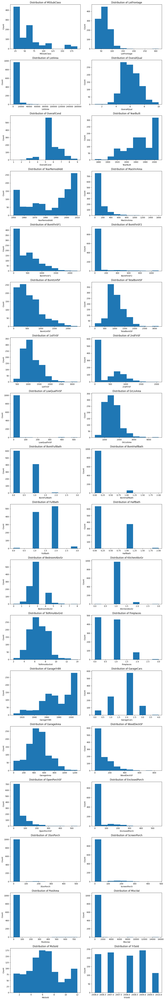

In [22]:
# Define columns to plot (excluding first column)
columns_to_plot = quantitative

# Calculate grid dimensions
n_cols = 2  # Number of columns in the grid
n = len(columns_to_plot)
n_rows = (n + 1) // n_cols  # Number of rows needed

# Create subplots grid with adjusted figure size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 4 * n_rows))
axes = axes.flatten()  # Convert to 1D array for easier handling

# Create plots in grid
for i, col in enumerate(columns_to_plot):
    ax = axes[i]
    if df[col].dtype == 'object':
        # Create bar plot for categorical data
        df[col].value_counts().sort_values(ascending=False).plot(kind='bar', ax=ax)
        ax.set_title(f"Value Counts for {col}")
        ax.set_xlabel('')  # Remove x-axis label
        ax.set_ylabel('')  # Remove y-axis label
    else:
        # Create histogram for numerical data
        df[col].hist(grid=False, ax=ax)
        ax.set_title(f"Distribution of {col}")
        ax.set_xlabel(col)
        ax.set_ylabel("Count")

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout()
plt.show()

### Relationship Between Categorical Columns and SalePrice (y)

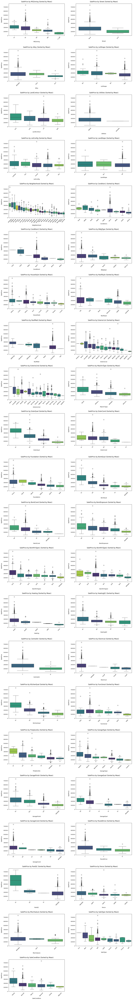

In [23]:
# Define columns to plot (excluding first column)
columns_to_plot = qualitative

# Calculate grid dimensions
n_cols = 2  # Number of columns
n = len(columns_to_plot)
n_rows = (n + 1) // n_cols  # Number of rows needed

# Create subplots grid with adjusted figure size
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
axes = axes.flatten()  # Convert to 1D array for easier handling

# Create plots in grid
for i, col in enumerate(columns_to_plot):
    ax = axes[i]
    # Calculate means and sort
    means = df.groupby(col)['SalePrice'].mean().sort_values(ascending=False)
    
    # Create boxplot with sorted categories - FIXED WARNING HERE
    sns.boxplot(
        x=col, 
        y='SalePrice', 
        data=df, 
        order=means.index, 
        hue=col,               # Added to resolve warning
        legend=False,          # Added to resolve warning
        palette='viridis',
        ax=ax
    )
    
    ax.set_title(f"SalePrice by {col} (Sorted by Mean)", pad=12)
    ax.set_xlabel(col, labelpad=10)
    ax.set_ylabel("SalePrice", labelpad=10)
    ax.tick_params(axis='x', rotation=45)
    
    # Improve readability of x-axis labels
    ax.xaxis.set_tick_params(labelsize=9)
    ax.yaxis.set_tick_params(labelsize=9)

# Hide any empty subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout and display
plt.tight_layout(pad=2.0)
plt.show()

### ANOVA Test

ANOVA (Analysis of Variance) is used to evaluate how strongly each categorical feature (e.g., "Neighborhood", "HouseStyle") influences the target variable, SalePrice.

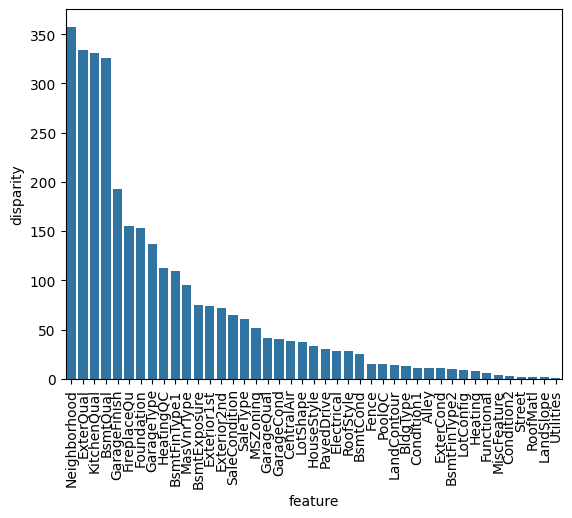

In [24]:


# Create a DataFrame to store the results of the ANOVA test
anv = pd.DataFrame()

# Initialize the DataFrame with a column named 'feature' to store categorical features
anv['feature'] = qualitative

# Initialize an empty list to store the p-values for each feature
pvals = []

# Loop through each categorical feature
for c in qualitative:
    samples = []  # Initialize a list to store the groups of 'SalePrice' for each unique category
    # Loop through each unique category in the current categorical feature
    for cls in df[c].unique():
        # Filter rows where the feature value equals the current category (cls)
        # Extract 'SalePrice' values for this category
        s = df[df[c] == cls]['SalePrice'].values
        samples.append(s)  # Add these values as a group to the samples list
    
    # Perform a one-way ANOVA test on the groups of 'SalePrice' (samples)
    # stats.f_oneway returns the F-statistic and p-value; [1] extracts the p-value
    pval = stats.f_oneway(*samples)[1]
    pvals.append(pval)  # Append the p-value to the list

# Add the calculated p-values to the results DataFrame
anv['pval'] = pvals

# Sort the DataFrame by p-values in ascending order
anv.sort_values('pval', inplace=True)

# Calculate the disparity for visualization: log(1/pval) magnifies significance
anv['disparity'] = np.log(1./anv['pval'].values)

# Create a bar plot using seaborn to visualize feature disparity
sns.barplot(data=anv, x='feature', y='disparity')

# Rotate the x-axis labels by 90 degrees for better readability
x = plt.xticks(rotation=90)


### Correlations

#### Encode
It’s useful to encode categorical features into numerical representations. The function encode is designed to create an ordinal encoding for a given categorical feature based on the mean Sale Price (SalePrice) of each category. This ensures the encoding reflects the relationship between the feature and the target variable.

In [25]:
def encode(frame, feature):
    ordering = pd.DataFrame()
    ordering['val'] = frame[feature].unique()
    ordering.index = ordering.val
    ordering['spmean'] = frame[[feature, 'SalePrice']].groupby(feature).mean()['SalePrice']
    ordering = ordering.sort_values('spmean')
    ordering['ordering'] = range(1, ordering.shape[0] + 1)
    ordering = ordering['ordering'].to_dict()
    
    for cat, o in ordering.items():
        frame.loc[frame[feature] == cat, feature + '_E'] = o
    
qual_encoded = []
for q in qualitative:  
    encode(df, q)
    qual_encoded.append(q + '_E')

print(qual_encoded)

['MSZoning_E', 'Street_E', 'Alley_E', 'LotShape_E', 'LandContour_E', 'Utilities_E', 'LotConfig_E', 'LandSlope_E', 'Neighborhood_E', 'Condition1_E', 'Condition2_E', 'BldgType_E', 'HouseStyle_E', 'RoofStyle_E', 'RoofMatl_E', 'Exterior1st_E', 'Exterior2nd_E', 'MasVnrType_E', 'ExterQual_E', 'ExterCond_E', 'Foundation_E', 'BsmtQual_E', 'BsmtCond_E', 'BsmtExposure_E', 'BsmtFinType1_E', 'BsmtFinType2_E', 'Heating_E', 'HeatingQC_E', 'CentralAir_E', 'Electrical_E', 'KitchenQual_E', 'Functional_E', 'FireplaceQu_E', 'GarageType_E', 'GarageFinish_E', 'GarageQual_E', 'GarageCond_E', 'PavedDrive_E', 'PoolQC_E', 'Fence_E', 'MiscFeature_E', 'SaleType_E', 'SaleCondition_E']


In [26]:
df[['Neighborhood', 'Neighborhood_E']].head()

,Neighborhood,Neighborhood_E
1093,NAmes,10.0
141,CollgCr,15.0
1434,Mitchel,11.0
357,MeadowV,3.0
530,Timber,20.0


#### Spearman Correlation

The next code computes the Spearman correlation between each feature and SalePrice and visualizes the results using a horizontal bar plot.

##### Why Spearman Correlation?
Spearman correlation is used in this analysis because:

* Handles Monotonic Relationships: Unlike Pearson correlation, which measures linear relationships, Spearman correlation captures monotonic relationships. This makes it more robust for features that might have a non-linear but consistent ranking association with SalePrice.
* Works with Ordinal Data: Some features, especially the encoded categorical variables (qual_encoded), are ordinal in nature. Spearman correlation is well-suited for such data since it is based on rank-order rather than raw values.
* Less Sensitive to Outliers: By relying on ranks, Spearman correlation is less affected by extreme values or outliers, which are common in real-world datasets like house prices.

<Axes: xlabel='spearman', ylabel='feature'>

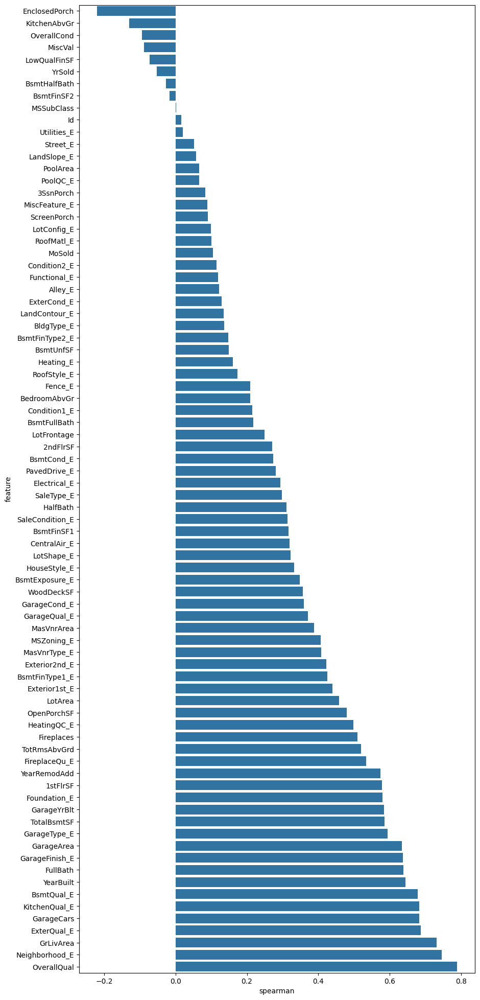

In [27]:
spr = pd.DataFrame()
features = df.select_dtypes(exclude='object').columns.tolist() + qual_encoded
features = [feature for feature in features if feature != 'SalePrice']
spr['feature'] = features
spr['spearman'] = [df[f].corr(df['SalePrice'], 'spearman') for f in features]
spr = spr.sort_values('spearman')
plt.figure(figsize=(10, 0.20*len(features)))
sns.barplot(data=spr, y='feature', x='spearman', orient='h')

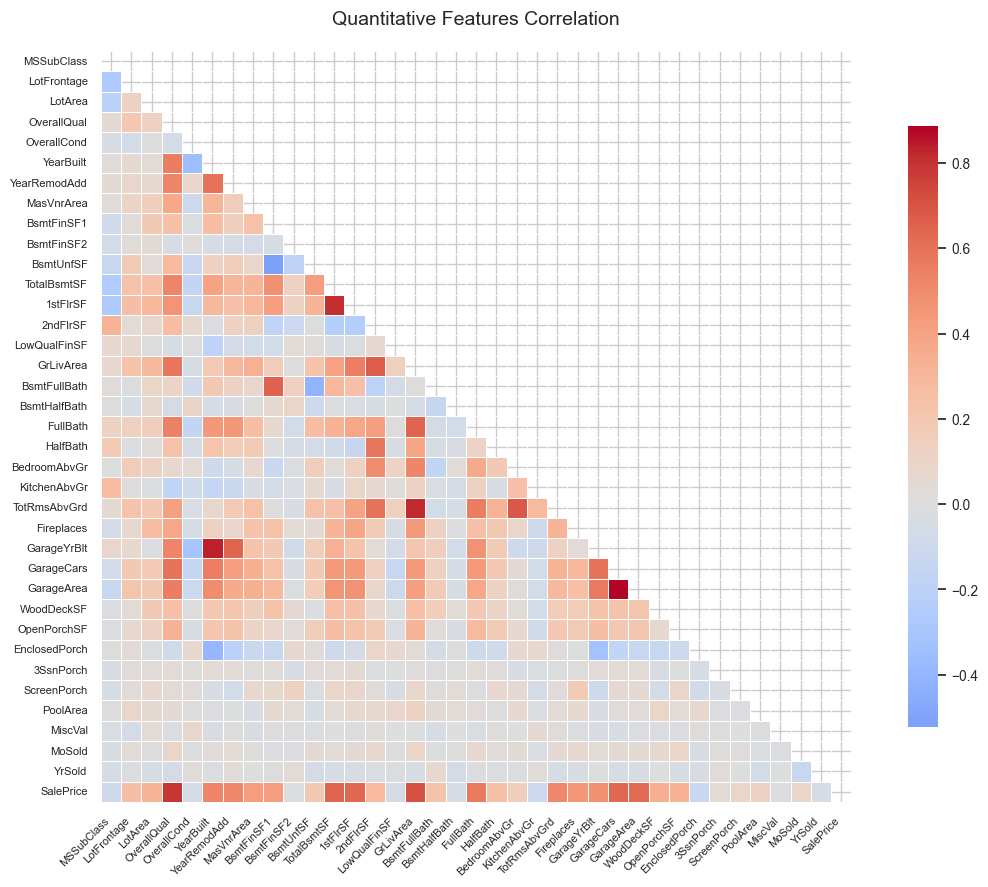

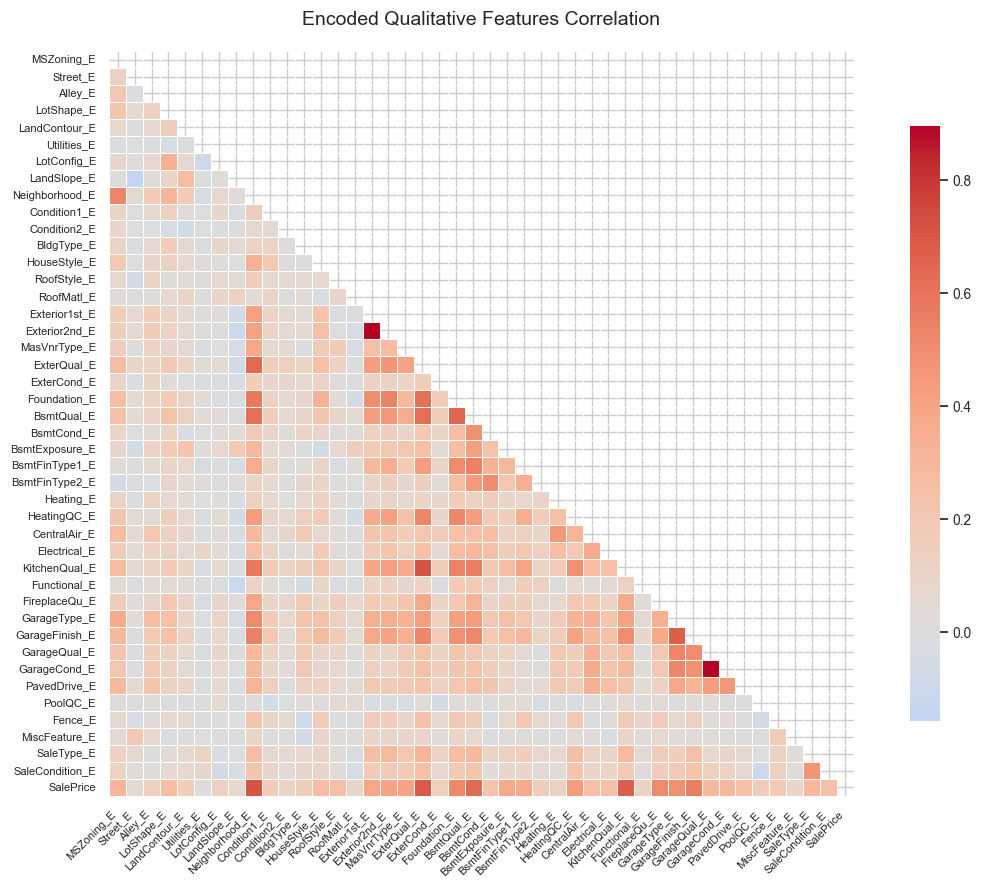

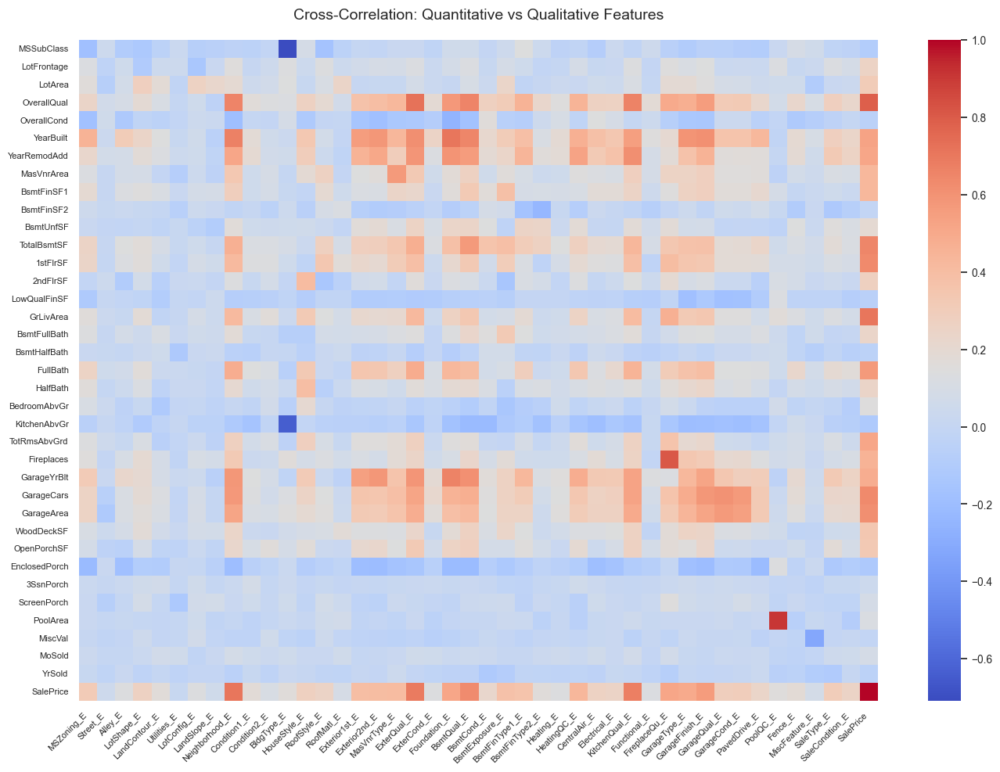

In [28]:
# Set style for better aesthetics
sns.set_theme(context="notebook", style="whitegrid", font_scale=0.9)

# Define helper function to plot heatmaps
def plot_corr_heatmap(data, columns, title, figsize=(12, 9)):
    plt.figure(figsize=figsize)
    corr = data[columns].corr()
    mask = None
    # Optional: Mask upper triangle for square matrices
    if len(columns) == len(corr.columns):
        mask = np.triu(np.ones_like(corr, dtype=bool))
    sns.heatmap(
        corr,
        cmap='coolwarm',
        annot=False,  # Set to True if you want values
        fmt=".2f",
        center=0,
        square=True,
        mask=mask,
        cbar_kws={'shrink': 0.8},
        linewidths=0.5
    )
    plt.title(title, fontsize=14, pad=20)
    plt.xticks(rotation=45, ha='right', fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.tight_layout()

# Plot quantitative features + SalePrice
plot_corr_heatmap(
    df,
    quantitative + ['SalePrice'],
    "Quantitative Features Correlation"
)

# Plot encoded qualitative features + SalePrice
plot_corr_heatmap(
    df,
    qual_encoded + ['SalePrice'],
    "Encoded Qualitative Features Correlation"
)

# Cross-correlation between quantitative and qualitative features
plt.figure(figsize=(14, 10))
corr = pd.DataFrame(np.zeros([len(quantitative)+1, len(qual_encoded)+1]), index=quantitative+['SalePrice'], columns=qual_encoded+['SalePrice'])
for q1 in quantitative+['SalePrice']:
    for q2 in qual_encoded+['SalePrice']:
        corr.loc[q1, q2] = df[q1].corr(df[q2])
sns.heatmap( 
    corr,
    cmap='coolwarm',
)
plt.title("Cross-Correlation: Quantitative vs Qualitative Features", fontsize=14, pad=20)
plt.xticks(rotation=45, ha='right', fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.tight_layout()

plt.show()

#### Variance Inflation Factor (VIF)

Variance Inflation Factor (VIF) is a measure used to detect multicollinearity in a dataset, particularly among the independent (predictor) variables. Multicollinearity occurs when two or more predictors are highly correlated, meaning they provide redundant or overlapping information.

In simple terms, VIF quantifies how much the variance of a feature’s coefficient in a regression model is inflated due to multicollinearity with other features.

In [29]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for numerical features
columns = quantitative + qual_encoded
columns = [feature for feature in columns if feature not in ['GarageYrBlt', "SalePrice"]] # Exclude GarageYrBlt by 
X = df[columns]
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(len(X.columns))]

print(vif_data)


c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\statsmodels\stats\outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


            feature         VIF
0        MSSubClass   12.444724
1       LotFrontage    7.901973
2           LotArea    4.367639
3       OverallQual   87.797807
4       OverallCond   51.536246
..              ...         ...
73         PoolQC_E  281.843687
74          Fence_E   36.704798
75    MiscFeature_E   95.814873
76       SaleType_E   76.250476
77  SaleCondition_E   69.798658

[78 rows x 2 columns]


In [30]:
# Sort VIF data for better visualization
vif_data = vif_data.sort_values(by="VIF", ascending=False)


In [31]:
vif_data.head(100)

,feature,VIF
13,2ndFlrSF,inf
12,1stFlrSF,inf
10,BsmtUnfSF,inf
11,TotalBsmtSF,inf
8,BsmtFinSF1,inf
...,...,...
28,EnclosedPorch,1.619173
17,BsmtHalfBath,1.304936
30,ScreenPorch,1.275176
32,MiscVal,1.210748


C:\Users\david\AppData\Local\Temp\ipykernel_8756\87166190.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=vif_data[vif_data["VIF"] <1000], x="VIF", y="feature", palette="viridis")


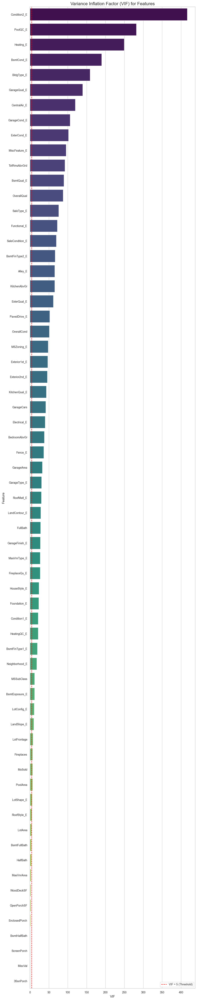

In [32]:
# Plot VIF values
plt.figure(figsize=(10, 50))
sns.barplot(data=vif_data[vif_data["VIF"] <1000], x="VIF", y="feature", palette="viridis")
plt.title("Variance Inflation Factor (VIF) for Features", fontsize=16)
plt.xlabel("VIF", fontsize=12)
plt.ylabel("Feature", fontsize=12)
plt.axvline(x=5, color='red', linestyle='--', label="VIF = 5 (Threshold)")
plt.legend()
plt.tight_layout()
plt.show()

### Pairplots
Sale price compares to each independent variable

In [33]:
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,GarageType_E,GarageFinish_E,GarageQual_E,GarageCond_E,PavedDrive_E,PoolQC_E,Fence_E,MiscFeature_E,SaleType_E,SaleCondition_E
1093,1094,20,RL,71.0,9230,Pave,MISSING,Reg,Lvl,AllPub,...,3.0,2.0,5.0,6.0,3.0,1.0,3.0,3.0,6.0,5.0
141,142,20,RL,78.0,11645,Pave,MISSING,Reg,Lvl,AllPub,...,6.0,4.0,5.0,6.0,3.0,1.0,5.0,3.0,6.0,5.0
1434,1435,20,RL,80.0,17400,Pave,MISSING,Reg,Low,AllPub,...,6.0,3.0,5.0,6.0,2.0,1.0,5.0,3.0,6.0,5.0
357,358,120,RM,44.0,4224,Pave,MISSING,Reg,Lvl,AllPub,...,6.0,4.0,5.0,6.0,3.0,1.0,3.0,3.0,6.0,5.0
530,531,80,RL,85.0,10200,Pave,MISSING,Reg,Lvl,AllPub,...,6.0,3.0,5.0,6.0,3.0,1.0,5.0,3.0,6.0,3.0


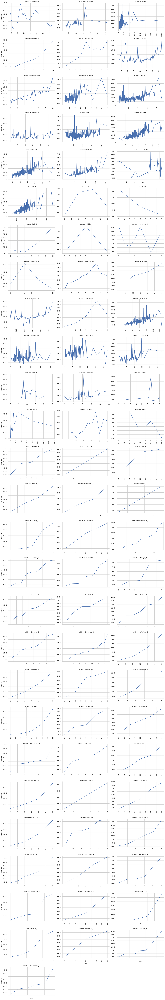

In [34]:
def pairplot(x, y, **kwargs):
    ax = plt.gca()
    ts = pd.DataFrame({'time': x, 'val': y})
    ts = ts.groupby('time').mean()
    ts.plot(ax=ax)
    plt.xticks(rotation=90)
    
f = pd.melt(df, id_vars=['SalePrice'], value_vars=quantitative+qual_encoded)
g = sns.FacetGrid(f, col="variable", col_wrap=3, sharex=False, sharey=False, height=4, aspect=1.5)  # Increase col_wrap for a wider layout
g = g.map(pairplot, "value", "SalePrice")

### Distribution Fitting and Linearity Evaluation
The idea aim to both understand the underlying distributions of the features and evaluate how different transformations impact the relationship between these features and the target variable (SalePrice). This is critical for ensuring that the data is well-prepared for linear modeling.

c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:6626: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_distn_infrastructure.py:2036: RuntimeWarning: overflow encountered in divide
  place(output, cond, self._pdf(*goodargs) / scale)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\scipy\stats\_continuous_distns.py:6626: RuntimeWarning: overflow encountered in divide
  return np.sum((1 + np.log(shifted/scale)/shape**2)/shifted)
c:\Users\david\Documents\Courses\MachineLearningPortfolio\.venv\Lib\site-packages\numpy\_core\f

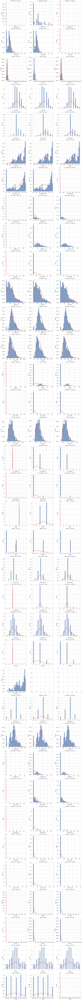

In [35]:
# Set the figure size
fig, axes = plt.subplots(nrows=len(quantitative), ncols=3, figsize=(15, 5 * len(quantitative)))

# Loop through features and plot each distribution in three columns
for i, feature in enumerate(quantitative):
    try:
        # Johnson SU
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 0])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 0].plot(x, stats.johnsonsu.pdf(x, *stats.johnsonsu.fit(df[feature])), color="red")
        axes[i, 0].set_title(f"{feature} - Johnson SU")

        # Normal Distribution
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 1])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 1].plot(x, stats.norm.pdf(x, *stats.norm.fit(df[feature])), color="red")
        axes[i, 1].set_title(f"{feature} - Normal")

        # Log-Normal Distribution
        sns.histplot(df[feature], kde=False, stat="density", bins=30, ax=axes[i, 2])
        x = np.linspace(df[feature].min(), df[feature].max(), 100)
        axes[i, 2].plot(x, stats.lognorm.pdf(x, *stats.lognorm.fit(df[feature])), color="red")
        axes[i, 2].set_title(f"{feature} - Log Normal")

    except:
        pass

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

### Find best distributions

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# ---------------------------------------------------
# 1. Define candidate distributions with constraints
# ---------------------------------------------------
DISTRIBUTIONS = [
    {
        "dist": stats.norm,
        "name": "Normal",
        "constraint": lambda data: True  # Always applicable
    },
    {
        "dist": stats.johnsonsu,
        "name": "Johnson SU",
        "constraint": lambda data: True
    },
    {
        "dist": stats.lognorm,
        "name": "Log-Normal",
        "constraint": lambda data: (data > 0).all()
    },
    {
        "dist": stats.expon,
        "name": "Exponential",
        "constraint": lambda data: (data >= 0).all()
    },
    {
        "dist": stats.weibull_min,
        "name": "Weibull",
        "constraint": lambda data: (data > 0).all()
    },
    # You can add more distributions if needed.
]

def best_fitting_distribution(data):
    """
    Fit each candidate distribution to data and return the one with the lowest AIC.
    If none fit, fallback to a Normal distribution.
    """
    best_dist = None
    best_aic = np.inf

    for candidate in DISTRIBUTIONS:
        if not candidate["constraint"](data):
            continue
        try:
            params = candidate["dist"].fit(data)
            log_likelihood = np.sum(candidate["dist"].logpdf(data, *params))
            k = len(params)
            aic = 2 * k - 2 * log_likelihood
            if aic < best_aic:
                best_aic = aic
                best_dist = {**candidate, "params": params}
        except Exception:
            continue

    if best_dist is None:
        best_dist = {
            "dist": stats.norm,
            "name": "Normal",
            "params": stats.norm.fit(data)
        }
    return best_dist

# ---------------------------------------------------
# 2. Transform each feature using its best-fitting distribution
# ---------------------------------------------------
# Assume 'quantitative' and 'qual_encoded' are your lists of feature names.
transformation_dict = {}  # Record which transformation is used for each feature

# Save best dist in a dictionary
best_distribution_dict = {}

for feature in quantitative + qual_encoded:
    data = df[feature].dropna()
    best_fit = best_fitting_distribution(data)
    transformation_dict[feature] = best_fit["name"]
    # Create a new column for the transformed feature using the fitted CDF.
    df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])

    # Save best dist in a dictionary
    best_distribution_dict[feature] = best_fit["dist"]

# ---------------------------------------------------
# 3. Also transform SalePrice using its best-fitting distribution
# ---------------------------------------------------
saleprice_data = df['SalePrice'].dropna()
best_fit_saleprice = best_fitting_distribution(saleprice_data)
saleprice_transformation = best_fit_saleprice["name"]
df["SalePrice_transformed"] = best_fit_saleprice["dist"].cdf(df["SalePrice"], *best_fit_saleprice["params"])

# ---------------------------------------------------
# 4. Create a grid of subplots: one row per feature, four columns:
#     Column 1: Raw feature vs. Raw SalePrice
#     Column 2: Transformed feature vs. Raw SalePrice
#     Column 3: Transformed feature vs. Transformed SalePrice
#     Column 4: Raw feature vs. Transformed SalePrice
# ---------------------------------------------------
n_features = len(quantitative + qual_encoded)
fig, axes = plt.subplots(n_features, 4, figsize=(24, 4 * n_features), squeeze=False)

for i, feature in enumerate(quantitative + qual_encoded):
    # ----------------------------
    # Column 1: Raw Feature vs. Raw SalePrice
    # ----------------------------
    ax1 = axes[i, 0]
    data_raw = df[[feature, 'SalePrice']].dropna()
    # Group by the raw feature values and compute the mean SalePrice
    temp_raw = data_raw.groupby(feature)['SalePrice'].mean().reset_index()
    ax1.plot(temp_raw[feature], temp_raw['SalePrice'], marker='o', linestyle='-')
    ax1.set_title(f"{feature} (Raw) vs. SalePrice (Raw)")
    ax1.set_xlabel(feature)
    ax1.set_ylabel("SalePrice (Raw)")
    
    # ----------------------------
    # Column 2: Transformed Feature vs. Raw SalePrice
    # ----------------------------
    ax2 = axes[i, 1]
    trans_feature = f"{feature}_transformed"
    data_trans_feature = df[[trans_feature, 'SalePrice']].dropna()
    temp_trans_feature = data_trans_feature.groupby(trans_feature)['SalePrice'].mean().reset_index()
    ax2.plot(temp_trans_feature[trans_feature], temp_trans_feature['SalePrice'], marker='o', linestyle='-')
    ax2.set_title(f"{feature} (Transformed: {transformation_dict[feature]}) vs. SalePrice (Raw)")
    ax2.set_xlabel("Transformed Value")
    ax2.set_ylabel("SalePrice (Raw)")
    
    # ----------------------------
    # Column 3: Transformed Feature vs. Transformed SalePrice
    # ----------------------------
    ax3 = axes[i, 2]
    data_trans_both = df[[trans_feature, 'SalePrice_transformed']].dropna()
    temp_trans_both = data_trans_both.groupby(trans_feature)['SalePrice_transformed'].mean().reset_index()
    ax3.plot(temp_trans_both[trans_feature], temp_trans_both['SalePrice_transformed'], marker='o', linestyle='-')
    ax3.set_title(f"{feature} (Transformed: {transformation_dict[feature]}) vs. SalePrice (Transformed: {saleprice_transformation})")
    ax3.set_xlabel("Transformed Value")
    ax3.set_ylabel("SalePrice (Transformed)")
    
    # ----------------------------
    # Column 4: Raw Feature vs. Transformed SalePrice
    # ----------------------------
    ax4 = axes[i, 3]
    data_raw_transSP = df[[feature, 'SalePrice_transformed']].dropna()
    temp_raw_transSP = data_raw_transSP.groupby(feature)['SalePrice_transformed'].mean().reset_index()
    ax4.plot(temp_raw_transSP[feature], temp_raw_transSP['SalePrice_transformed'], marker='o', linestyle='-')
    ax4.set_title(f"{feature} (Raw) vs. SalePrice (Transformed: {saleprice_transformation})")
    ax4.set_xlabel(feature)
    ax4.set_ylabel("SalePrice (Transformed)")

plt.tight_layout()
plt.show()


C:\Users\david\AppData\Local\Temp\ipykernel_8756\2185698452.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])
C:\Users\david\AppData\Local\Temp\ipykernel_8756\2185698452.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[f"{feature}_transformed"] = best_fit["dist"].cdf(df[feature], *best_fit["params"])
C:\Users\david\AppData\Local\Temp\ipykernel_8756\2185698452.py:82: PerformanceWarning: DataFrame is highly fragmented.  This is usually 

---
## **4. Prepare the data for machine learning algorithms.**

In [37]:

df = pd.read_csv("../data/house_price_project/train.csv")

df, df_test = split_train_test(df , bins=bins_to_split)

# Define X and y for training
X_train = df.drop(columns=['SalePrice'])  # Features
y_train = df['SalePrice']  # Target variable

# Define X_test 
X_test = df_test.drop(columns=['SalePrice'])
y_test = df_test['SalePrice']



### Transform X features

In [102]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, StandardScaler
from sklearn.impute import SimpleImputer

def delete_id(X):
    X = X.copy()
    return X.drop("Id", axis=1)


def replace_missing_values(X):
    X = X.copy()
    for col in X.columns:
        if X[col].dtype == 'object':
            X[col] = X[col].fillna("MISSING")

    X["MasVnrArea"].fillna(0, inplace=True)
    X["LotFrontage"].fillna(21, inplace=True) # Min LotFrontage

    # Impute ALL other numerical columns (e.g., mean/median)
    numerical_cols = X.select_dtypes(include=np.number).columns
    for col in numerical_cols:
        X[col].fillna(0, inplace=True)
    return X


def delete_features(X):
    X = X.copy()
    # delete garagecars & garageyrblt by extreme correlation with another values
    return X.drop(["GarageCars", "GarageYrBlt"], axis=1)

In [103]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class TargetEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, drop_original=True):
        self.drop_original = drop_original
        self.mapping_ = {}  # to store mapping for each feature
        self.features = None

    def fit(self, X, y):
        # Define features based on object dtype columns in X
        self.features = X.select_dtypes(include='object').columns.tolist()
        for feature in self.features:
            df_temp = pd.DataFrame({feature: X[feature], 'SalePrice': y})
            ordering = df_temp.groupby(feature)['SalePrice'].mean().sort_values()
            mapping = {cat: rank for rank, cat in enumerate(ordering.index, start=1)}
            self.mapping_[feature] = mapping
        return self

    def transform(self, X):
        X = X.copy()
        for feature in self.features:
            X[feature + '_E'] = X[feature].map(self.mapping_.get(feature))
            # Optionally handle unseen categories
            X[feature + '_E'].fillna(0, inplace=True)
            if self.drop_original:
                X.drop(columns=[feature], inplace=True)
        return X

In [104]:
best_distribution_dict

{'MSSubClass': <scipy.stats._continuous_distns.lognorm_gen at 0x18370592c10>,
 'LotFrontage': <scipy.stats._continuous_distns.lognorm_gen at 0x18370592c10>,
 'LotArea': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'OverallQual': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'OverallCond': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'YearBuilt': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'YearRemodAdd': <scipy.stats._continuous_distns.lognorm_gen at 0x18370592c10>,
 'MasVnrArea': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'BsmtFinSF1': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'BsmtFinSF2': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'BsmtUnfSF': <scipy.stats._continuous_distns.expon_gen at 0x183705390d0>,
 'TotalBsmtSF': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 '1stFlrSF': <scipy.stats._continuous_distns.john

In [105]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd

class FeaturesTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, features_to_transform: dict):
        self.features_to_transform = features_to_transform
        self.mapping_ = {}

    def fit(self, X, y=None):
        for feature, distribution in self.features_to_transform.items():
            params = distribution.fit(X[feature].dropna())  # Ensure we fit only on non-null values
            self.mapping_[feature] = params  # Save fitted parameters
        return self

    def transform(self, X):
        X = X.copy()
        for feature, distribution in self.features_to_transform.items():
            if feature in self.mapping_:
                params = self.mapping_[feature]
                # Ensure NaN values are preserved
                X[feature] = X[feature].apply(lambda x: distribution.cdf(x, *params) if pd.notna(x) else 0) # Cero based on EDA 
        return X



In [106]:

features_to_transform = [
    "OverallQual", "BsmtFinSF2", "TotalBsmtSF", "1stFlrSF",
    "LowQualFinSF", "GrLivArea", "BsmtFullBath", "BsmtHalfBath",
    "FullBath", "HalfBath", "TotRmsAbvGrd",
    "GarageArea", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal",
    "MoSold"
    ]

features_to_transform_distributions = {}
for feature in features_to_transform:
    features_to_transform_distributions[feature] = best_distribution_dict[feature]

In [107]:
features_to_transform_distributions

{'OverallQual': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'BsmtFinSF2': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'TotalBsmtSF': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 '1stFlrSF': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'LowQualFinSF': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'GrLivArea': <scipy.stats._continuous_distns.lognorm_gen at 0x18370592c10>,
 'BsmtFullBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'BsmtHalfBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'FullBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'HalfBath': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'TotRmsAbvGrd': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 'GarageArea': <scipy.stats._continuous_distns.johnsonsu_gen at 0x1835e607cd0>,
 '3SsnPorch': <scipy.stats._continuous_

In [108]:

from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import RobustScaler
import pandas as pd

class FeaturesRobustScaler(BaseEstimator, TransformerMixin):
    def __init__(self):
        """
        Custom transformer for robust feature scaling (handling outliers).
        :param features_to_scale: List of feature names to be scaled
        """
        self.scalers_ = {}

    def fit(self, X, y=None):
        """
        Fits a RobustScaler to each feature separately.
        """
        X = X.copy()
  
        
        for feature in X.columns:
            scaler = RobustScaler()
            scaler.fit(X[[feature]])  # Fit only on training data
            self.scalers_[feature] = scaler  # Store scaler for each feature
        
        return self

    def transform(self, X):
        """
        Applies the fitted RobustScaler to the dataset.
        """
        X = X.copy()
        for feature, scaler in self.scalers_.items():
            X[feature] = scaler.transform(X[[feature]])  # Apply scaling

        return X

In [109]:


# Pipeline Definition
feature_pipeline  = Pipeline([
    ("delete_id", FunctionTransformer(delete_id)),
    ('replace_missing_values', FunctionTransformer(replace_missing_values)),
    ("delete_features", FunctionTransformer(delete_features)),
    ("target_encoder", TargetEncoder(drop_original=True)),
    ("features_transformer", FeaturesTransformer(features_to_transform=features_to_transform_distributions)),
    ("features_robust_scaler", FeaturesRobustScaler()),
])


### Transform Y features

In [46]:
class JohnsonSUTransformer:
    def __init__(self):
        self.shape1_ = None  # a (gamma) parameter
        self.shape2_ = None  # b (delta) parameter
        self.loc_ = None    # loc (epsilon)
        self.scale_ = None  # scale (lambda)

    def fit(self, y):
        """Fit Johnson SU distribution to `y` and store parameters."""
        # Ensure no NaN in y (critical for fitting)
        if np.isnan(y).any():
            raise ValueError("Input `y` contains NaN values. Handle them first.")
        self.shape1_, self.shape2_, self.loc_, self.scale_ = stats.johnsonsu.fit(y)
        return self

    def transform(self, y):
        """Transform `y` to follow a standard normal distribution."""
        z = (y - self.loc_) / self.scale_
        return self.shape1_ + self.shape2_ * np.arcsinh(z)  # Z ~ N(0,1)

    def inverse_transform(self, y_transformed):
        """Invert the transformation to get back original `y`."""
        z = (y_transformed - self.shape1_) / self.shape2_
        return self.loc_ + self.scale_ * np.sinh(z)


    
# Initialize Johnson SU transformer
johnson_su = JohnsonSUTransformer()
# Fit the transformer on `y_train`
johnson_su.fit(y_train)


## 5. Select a model, train & Fine-tune it

### Testing of different regressions

In [ ]:
from skopt.space import Real, Categorical, Integer

from sklearn.compose import TransformedTargetRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import ElasticNet


models = {
    "Linear Regression": TransformedTargetRegressor(
        regressor=LinearRegression(),
        func=johnson_su.transform,
        inverse_func=johnson_su.inverse_transform
    ),
    "Ridge Regression": TransformedTargetRegressor(
        regressor=Ridge(),
        func=johnson_su.transform,
        inverse_func=johnson_su.inverse_transform
    ),
    "Lasso Regression": TransformedTargetRegressor(
        regressor=Lasso(),
        func=johnson_su.transform,
        inverse_func=johnson_su.inverse_transform
    ),
    "Bayesian Ridge": TransformedTargetRegressor(
        regressor=BayesianRidge(),
        func=johnson_su.transform,
        inverse_func=johnson_su.inverse_transform
    ),
    "ElasticNet": TransformedTargetRegressor(
        regressor=ElasticNet(),
        func=johnson_su.transform,
        inverse_func=johnson_su.inverse_transform
    ),
}



param_spaces = {
    "Linear Regression": {},  # No hyperparameters

    "Ridge Regression": {
        "model__regressor__alpha": Real(1e-3, 1e3, prior='log-uniform')
    },

    "Lasso Regression": {
        "model__regressor__alpha": Real(1e-3, 1e2, prior='log-uniform')
    },

    "Bayesian Ridge": {
        "model__regressor__alpha_1": Real(1e-7, 1e-1, prior='log-uniform'),
        "model__regressor__alpha_2": Real(1e-7, 1e-1, prior='log-uniform'),
        "model__regressor__lambda_1": Real(1e-7, 1e-1, prior='log-uniform'),
        "model__regressor__lambda_2": Real(1e-7, 1e-1, prior='log-uniform'),
    },

    "ElasticNet": {
        "model__regressor__alpha": Real(1e-3, 1e3, prior='log-uniform'),
        "model__regressor__l1_ratio": Real(0.0, 1.0),
    },
}


In [82]:
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from skopt import BayesSearchCV

# results = {}

# for name, model in models.items():
#     print(f"Processing {name}...")
    
#     full_pipeline = Pipeline([
#         ("features", feature_pipeline),
#         ("model", model)
#     ])

#     # Skip Bayesian search if no parameters to tune
#     if not param_spaces[name]:
#         print(f"No hyperparameters to tune for {name}, using default parameters")
#         estimator = full_pipeline.fit(X_train, y_train)
#     else:
#         print(f"Tuning {name} with Bayesian optimization...")
#         bayes_search = BayesSearchCV(
#             full_pipeline,
#             search_spaces=param_spaces[name],
#             scoring="neg_mean_squared_error",
#             cv=5,
#             n_iter=40,
#             n_jobs=-1,
#             random_state=42
#         )
#         bayes_search.fit(X_train, y_train)
#         estimator = bayes_search.best_estimator_

#     # Common evaluation for both tuned and non-tuned models
#     y_pred = estimator.predict(X_test)
    
#     rmse = np.sqrt(mean_squared_error(y_test, y_pred))
#     mae = mean_absolute_error(y_test, y_pred)
    
#     cv_rmse = np.sqrt(-cross_val_score(estimator, X_train, y_train, 
#                                       scoring="neg_mean_squared_error", cv=5)).mean()
#     cv_mae = -cross_val_score(estimator, X_train, y_train, 
#                              scoring="neg_mean_absolute_error", cv=5).mean()

#     results[name] = {
#         "Best Params": bayes_search.best_params_ if param_spaces[name] else "No tuning",
#         "Test RMSE": rmse,
#         "CV RMSE": cv_rmse,
#         "Test MAE": mae,
#         "CV MAE": cv_mae
#     }


In [83]:
# Print results in a compact table format
# header = f"{'Model':<17} | {'Best Params':<45} | {'Test RMSE':>10} | {'CV RMSE':>10} | {'Test MAE':>10} | {'CV MAE':>10}"
# print(header)
# print("-" * len(header))

# for model, scores in results.items():
#     # Process parameters for better formatting
#     params = str(scores['Best Params'])
    
#     # Simplify parameter formatting
#     params = (
#         params.replace("OrderedDict(", "")
#               .replace("model__regressor__", "")  # Remove redundant prefix
#               .replace("'", "")                    # Remove quotes
#               .replace("), ", ")\n")               # Create line breaks
#               .replace(")]", ")")                  # Fix last item
#     )
    
#     # Split parameters into multiple lines
#     param_lines = [line.strip() for line in params.split("\n") if line.strip()]
    
#     # Print first line with all metrics
#     print(f"{model:<17} | {param_lines[0]:<45} | "
#           f"{scores['Test RMSE']:>10.2f} | "
#           f"{scores['CV RMSE']:>10.2f} | "
#           f"{scores['Test MAE']:>10.2f} | "
#           f"{scores['CV MAE']:>10.2f}")
    
#     # Print additional parameter lines without repeating metrics
#     for line in param_lines[1:]:
#         print(f"{'':<17} | {line:<45} | {'':>10} | {'':>10} | {'':>10} | {'':>10}")

#     # Add separator line
#     print("-" * len(header))


#### Results (if you do not want to run the cells above)

![Description](../data/house_price_project/result_test_linear_regressions.png)

### Weighted Average Ensemble

In [69]:
# TODO
# Put lasso and elasticnet together

lasso_model = Lasso(alpha=0.001543243463083157)

lasso_model_full_pipeline = Pipeline([
    ("features", feature_pipeline),
    ("model", lasso_model)
])

lasso_model_full_pipeline.fit(X_train, y_train)
lasso_y_pred = lasso_model_full_pipeline.predict(X_test)

elasticnet_ridge_model = ElasticNet(alpha=0.0026126580429263107, l1_ratio=0.5756887701553944)

elasticnet_model_full_pipeline = Pipeline([
    ("features", feature_pipeline),
    ("model", elasticnet_ridge_model)
])

elasticnet_model_full_pipeline.fit(X_train, y_train)
elasticnet_y_pred = elasticnet_model_full_pipeline.predict(X_test)

# bayesian
# bayesian_ridge_model = BayesianRidge(alpha_1=0.1, alpha_2=0.9999999844984233, lambda_1=0.0931534567938109, lambda_2=0.08572614735434406)

# bayesian_model_full_pipeline = Pipeline([
#     ("features", feature_pipeline),
#     ("model", bayesian_ridge_model)
# ])

# bayesian_model_full_pipeline.fit(X_train, y_train)
# bayesian_y_pred = bayesian_model_full_pipeline.predict(X_test)

blended_y_pred = lasso_y_pred * 0.5 + elasticnet_y_pred * 0.5
rmse = np.sqrt(mean_squared_error(y_test, blended_y_pred))
mae = mean_absolute_error(y_test, blended_y_pred)



print(f"Weights: Lasso = 0.5, ElasticNet = 0.5 - Test RMSE = {rmse:.4f}, Test MAE = {mae:.4f}")

C:\Users\david\AppData\Local\Temp\ipykernel_8756\2409789506.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X["MasVnrArea"].fillna(0, inplace=True)
C:\Users\david\AppData\Local\Temp\ipykernel_8756\2409789506.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, whe

Weights: Lasso = 0.5, ElasticNet = 0.5 - Test RMSE = 43269.4857, Test MAE = 23644.2018


### Stacking Ensemble

In [74]:
# TODO stacked generalization

from sklearn.linear_model import RidgeCV

ridge_model = Ridge(alpha=10.677742586857784)

ridge_model_full_pipeline = Pipeline([
    ("features", feature_pipeline),
    ("model", ridge_model)
])

lasso_model = Lasso(alpha=0.001543243463083157)

lasso_model_full_pipeline = Pipeline([    
    ("features", feature_pipeline),
    ("model", lasso_model)
])

elasticnet_ridge_model = ElasticNet(alpha=0.0026126580429263107, l1_ratio=0.5756887701553944)

elasticnet_model_full_pipeline = Pipeline([
    ("features", feature_pipeline),
    ("model", elasticnet_ridge_model)
])

bayesian_ridge_model = BayesianRidge(alpha_1=0.1, alpha_2=0.9999999844984233, lambda_1=0.0931534567938109, lambda_2=0.08572614735434406)

bayesian_model_full_pipeline = Pipeline([
    ("features", feature_pipeline),
    ("model", bayesian_ridge_model)
])


from sklearn.ensemble import StackingRegressor
estimators = [
    ("ridge", ridge_model_full_pipeline),
    ("lasso", lasso_model_full_pipeline),
    ("elasticnet", elasticnet_model_full_pipeline),
    ("bayesian", bayesian_model_full_pipeline)
]
stacker = StackingRegressor(estimators, final_estimator=RidgeCV(cv=5))

stacker.fit(X_train, y_train)
stacker_y_pred = stacker.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, stacker_y_pred))
mae = mean_absolute_error(y_test, stacker_y_pred)

print(f"Test Stacked of {[est[0] for est in estimators]} RMSE = {rmse:.4f}, Test MAE = {mae:.4f}")

C:\Users\david\AppData\Local\Temp\ipykernel_8756\2409789506.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X["MasVnrArea"].fillna(0, inplace=True)
C:\Users\david\AppData\Local\Temp\ipykernel_8756\2409789506.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, whe

Test Stacked of ['ridge', 'lasso', 'elasticnet', 'bayesian'] RMSE = 40169.5750, Test MAE = 22738.9586


## 6. Solution
Based on the models tested the best was ElasticNet with the following parameters: alpha: 0.0026126580429263107 and l1_ratio: 0.5756887701553944.

In [110]:
final_test = pd.read_csv("../data/house_price_project/test.csv")

elasticnet_ridge_model = ElasticNet(alpha=0.0026126580429263107, l1_ratio=0.5756887701553944)

elasticnet_model_full_pipeline = Pipeline([
    ("features", feature_pipeline),
    ("model", elasticnet_ridge_model)
])

elasticnet_model_full_pipeline.fit(X_train, y_train)
elasticnet_y_pred = elasticnet_model_full_pipeline.predict(final_test)

# Save predictions to CSV
submission = pd.DataFrame({
    "Id": final_test["Id"],
    "SalePrice": elasticnet_y_pred
})
submission.to_csv("../data/house_price_project/submission.csv", index=False)

C:\Users\david\AppData\Local\Temp\ipykernel_8756\2332553233.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X["MasVnrArea"].fillna(0, inplace=True)
C:\Users\david\AppData\Local\Temp\ipykernel_8756\2332553233.py:19: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, whe

### Final Score

![Description](../data/house_price_project/final_score.png)